# EDA
* Imports
* Paths, output folder
* Load manifest and basic inspection
* Original vs DeepFake Videos
* Original vs DeepFake Images
* class balance
* Frames per video distribution
* Sample Face grids
* Brightness and blur measurement


## Imports

In [1]:
import os, math, random
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from tqdm import tqdm

In [2]:
sns.set(style = 'whitegrid')
plt.rcParams['figure.figsize'] = (8,4)      ## Setup for sns

## Path Setup


In [3]:
BASE_DIR = Path().resolve().parents[0]  ## sets the path to folder header

MANIFEST = BASE_DIR / 'data' / 'processed' / 'manifest.csv'
OUT_DIR = BASE_DIR / 'outputs' / 'eda'

OUT_DIR.mkdir(parents=True, exist_ok=True)

print(BASE_DIR)         ## Path verification
print(MANIFEST)
print(MANIFEST.exists())

/home/aryan/code/DeepFakeDetection
/home/aryan/code/DeepFakeDetection/data/processed/manifest.csv
True


## Basic Inspection
* Total rows
* Total unique videos
* Class distribution


In [4]:
df = pd.read_csv(MANIFEST)
print("Total rows (faces):", len(df))
print("Unigue videos:", df['video_id'].nunique())  ## Total number of unique videos 
print('Class distribution:',df['label'].value_counts())   ## 0 --> Real and 1 --> Fake
display(df.head())


Total rows (faces): 33052
Unigue videos: 324
Class distribution: label
0    22322
1    10730
Name: count, dtype: int64


,image_path,label,video_id
0,/home/aryan/code/DeepFakeDetection/data/proces...,0,360
1,/home/aryan/code/DeepFakeDetection/data/proces...,0,360
2,/home/aryan/code/DeepFakeDetection/data/proces...,0,360
3,/home/aryan/code/DeepFakeDetection/data/proces...,0,360
4,/home/aryan/code/DeepFakeDetection/data/proces...,0,360


## Side-by-side: Original vs DeepFake Videos

In [5]:
from IPython.display import HTML
from base64 import b64encode

def video_as_html(video_path, width=300):
    mp4 = open(video_path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    return f"""
    <video width="{width}" controls>
        <source src="{data_url}" type="video/mp4">
    </video>
    """

# Your two video paths
orig_video = "/home/aryan/code/DeepFakeDetection/data/raw/original_sequences/youtube/c23/videos/866.mp4"
orig_video2 = "/home/aryan/code/DeepFakeDetection/data/raw/original_sequences/youtube/c23/videos/878.mp4"
fake_video = "/home/aryan/code/DeepFakeDetection/data/raw/manipulated_sequences/Deepfakes/c23/videos/866_878.mp4"

html = f"""
<div style="display: flex; gap: 20px;">
    <div>
        <h4>Original 1</h4>
        {video_as_html(orig_video)}
    </div>
    <div>
        <h4> Original 2</h4>
        {video_as_html(orig_video2)}
    </div>
    <div>
        <h4>DeepFake</h4>
        {video_as_html(fake_video)}
    </div>
</div>
"""

HTML(html)


## Side-by-side: Original vs DeepFake Images


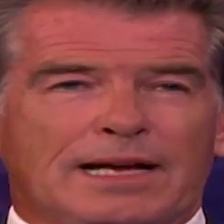
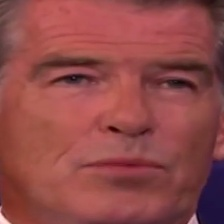
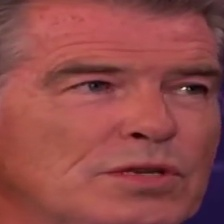
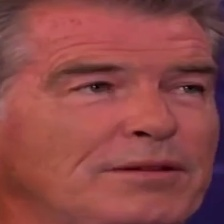
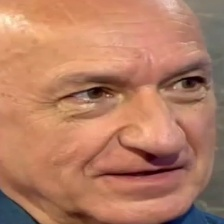
...
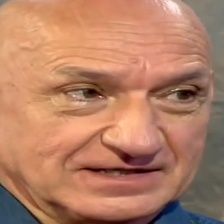
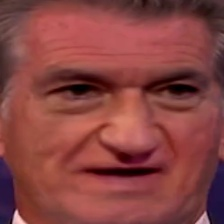
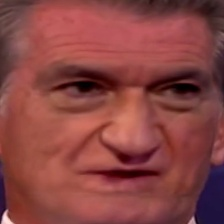
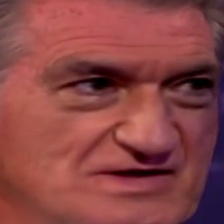
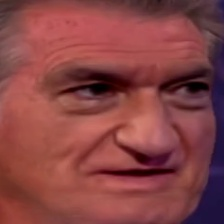

In [6]:
from IPython.display import HTML
from pathlib import Path
import base64

def img_tag(path, width=120):
    with open(path, "rb") as f:
        data = base64.b64encode(f.read()).decode()
    return f'<img src="data:image/jpeg;base64,{data}" width="{width}">'

def show_multiple_faces(face_dir, n=4):
    paths = sorted(Path(face_dir).glob("*.jpg"))[:n]
    tags = "".join(img_tag(p) for p in paths)
    return f'<div style="display: flex; gap: 5px;">{tags}</div>'

orig1_dir = "/home/aryan/code/DeepFakeDetection/data/processed/faces/866"
orig2_dir = "/home/aryan/code/DeepFakeDetection/data/processed/faces/878"
fake_dir  = "/home/aryan/code/DeepFakeDetection/data/processed/faces/866_878"

html = f"""
<div style="display: flex; flex-direction: row; gap: 40px;">
    <div>
        <h4>Original 1</h4>
        {show_multiple_faces(orig1_dir)}
    </div>
    <div>
        <h4>Original 2</h4>
        {show_multiple_faces(orig2_dir)}
    </div>
    <div>
        <h4>DeepFake</h4>
        {show_multiple_faces(fake_dir)}
    </div>
</div>
"""

HTML(html)


## Class Balance

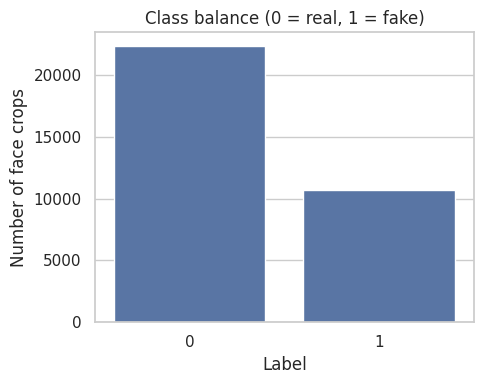

In [7]:
ct = df['label'].value_counts().sort_index()
plt.figure(figsize=(5,4))
sns.barplot(x=ct.index.astype(str), y=ct.values)
plt.title('Class balance (0 = real, 1 = fake)')
plt.xlabel('Label')
plt.ylabel('Number of face crops')
plt.tight_layout()
plt.savefig(OUT_DIR / 'class_balance.png', dpi=150)
plt.show()


## Frames-per-video distribution

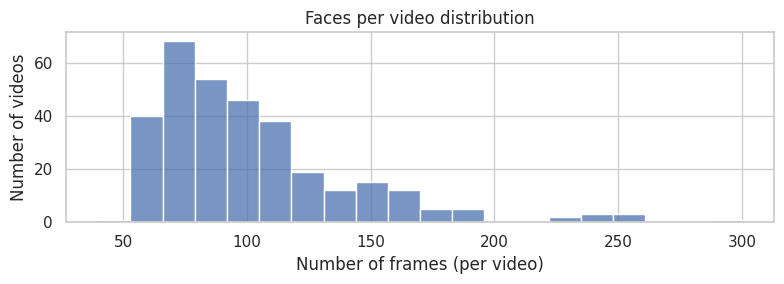

In [8]:
faces_per_video = df.groupby('video_id').size().sort_values(ascending=False)
plt.figure(figsize=(8,3))
sns.histplot(faces_per_video, bins=20)
plt.title('Faces per video distribution')
plt.xlabel('Number of frames (per video)')
plt.ylabel('Number of videos')
plt.tight_layout()
plt.savefig(OUT_DIR / 'faces_per_video.png', dpi=150)
plt.show()


## Sample Grid

Saved sample grid to /home/aryan/code/DeepFakeDetection/outputs/eda/sample_grid.png


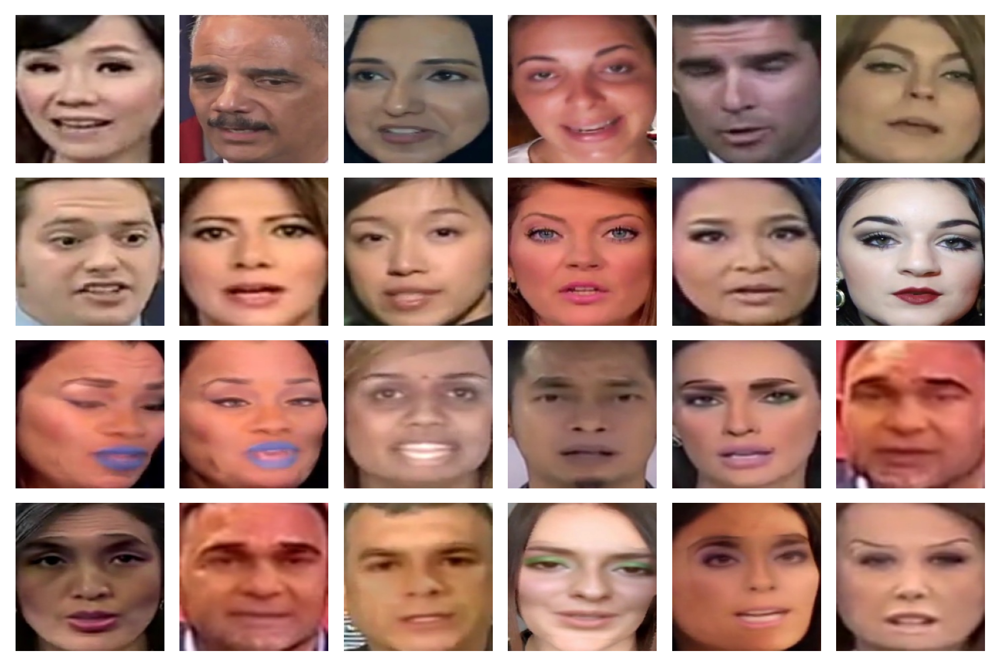

In [9]:
def make_sample_grid(df, out_path, n_per_class=12, cols=6):
    imgs = []
    labels = sorted(df['label'].unique())
    for label in labels:
        subset = df[df['label']==label]
        sample = subset.sample(n=min(n_per_class, len(subset)), random_state=42)
        imgs.extend(list(sample['image_path']))

    rows = math.ceil(len(imgs)/cols)
    fig, axs = plt.subplots(rows, cols, figsize=(cols*2, rows*2))
    axs = axs.flatten()
    for ax, p in zip(axs, imgs):
        try:
            im = Image.open(p).convert('RGB')
            ax.imshow(im)
        except Exception:
            ax.text(0.5, 0.5, 'ERR', ha='center')
        ax.axis('off')
    for ax in axs[len(imgs):]:
        ax.axis('off')
    plt.tight_layout()
    plt.savefig(out_path, dpi=150)
    plt.close()
    print('Saved sample grid to', out_path)

make_sample_grid(df, OUT_DIR / 'sample_grid.png', n_per_class=12, cols=6)
from IPython.display import Image, display
display(Image(str(OUT_DIR / 'sample_grid.png')))
